In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Task 1

In [2]:
import os
import json
import torch
import numpy as np
from torchvision import transforms, datasets, models
from torch.utils.data import DataLoader

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

### Loading Pre-trained model

In [3]:
# pretrained_model = torchvision.models.resnet34(weights='IMAGENET1K_V1')
model = models.resnet34(weights=models.ResNet34_Weights.IMAGENET1K_V1)
model = model.to(device)
model.eval()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

### Define the transforms

In [4]:
mean_norms = np.array([0.485, 0.456, 0.406])
std_norms  = np.array([0.229, 0.224, 0.225])
plain_transforms = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=mean_norms, std=std_norms)
])
dataset_path ="/content/drive/MyDrive/NYU CS/Deep Learning/project3/TestDataSet"
dataset = datasets.ImageFolder(root=dataset_path, transform=plain_transforms)
print(dataset.classes[:20])   # Print only the first 20 to have a look
print("Total", len(dataset.classes), "classes")

['n02672831', 'n02676566', 'n02687172', 'n02690373', 'n02692877', 'n02699494', 'n02701002', 'n02704792', 'n02708093', 'n02727426', 'n02730930', 'n02747177', 'n02749479', 'n02769748', 'n02776631', 'n02777292', 'n02782093', 'n02783161', 'n02786058', 'n02787622']
Total 100 classes


### Read the labels.json and establish the mapping

In [5]:
# Obtain 100 SynSets
synsets = dataset.classes

# Obtain 100 class names
with open(os.path.join(dataset_path, "labels_list.json"), "r") as f:
    label_list = json.load(f)

# Extract the class name section
json_classnames = [x.split(": ")[1] for x in label_list]

print("The first 5 synsets in the folder:", synsets[:5])
print("The first 5 classes names of labels_list.json:", json_classnames[:5])

# Print out the forms that need to compare manually
for i, (syn, name) in enumerate(zip(synsets, json_classnames)):
    print(f"{i:3}:  {syn:<12}  <--→  {name}")


The first 5 synsets in the folder: ['n02672831', 'n02676566', 'n02687172', 'n02690373', 'n02692877']
The first 5 classes names of labels_list.json: ['accordion', 'acoustic guitar', 'aircraft carrier', 'airliner', 'airship']
  0:  n02672831     <--→  accordion
  1:  n02676566     <--→  acoustic guitar
  2:  n02687172     <--→  aircraft carrier
  3:  n02690373     <--→  airliner
  4:  n02692877     <--→  airship
  5:  n02699494     <--→  altar
  6:  n02701002     <--→  ambulance
  7:  n02704792     <--→  amphibian
  8:  n02708093     <--→  analog clock
  9:  n02727426     <--→  apiary
 10:  n02730930     <--→  apron
 11:  n02747177     <--→  ashcan
 12:  n02749479     <--→  assault rifle
 13:  n02769748     <--→  backpack
 14:  n02776631     <--→  bakery
 15:  n02777292     <--→  balance beam
 16:  n02782093     <--→  balloon
 17:  n02783161     <--→  ballpoint
 18:  n02786058     <--→  Band Aid
 19:  n02787622     <--→  banjo
 20:  n02788148     <--→  bannister
 21:  n02790996     <--→ 

In [6]:
# Obtain 100 SynSets
synsets = dataset.classes

# Obtain 100 class names
with open(os.path.join(dataset_path, "labels_list.json"), "r") as f:
    label_list = json.load(f)  # e.g. ["0: accordion", "1: acoustic guitar", ...]

r_label_list = {x.split(": ")[1]: x.split(": ")[0] for x in label_list}

# Extract the class name section
json_classnames = [x.split(": ")[1] for x in label_list]

print("The first 5 synsets in the folder:", synsets[:5])
print("The first 5 classes names of labels_list.json:", json_classnames[:5])

# Print out the forms that need to compare manually
numeric_labels = []
for i, (syn, name) in enumerate(zip(synsets, json_classnames)):
    # print(f"{i:3}:  {syn:<12}  <--→  {name}")
    numeric_labels.append(int(r_label_list[name]))

print("First 5 numeric labels:", numeric_labels[:5])

The first 5 synsets in the folder: ['n02672831', 'n02676566', 'n02687172', 'n02690373', 'n02692877']
The first 5 classes names of labels_list.json: ['accordion', 'acoustic guitar', 'aircraft carrier', 'airliner', 'airship']
First 5 numeric labels: [401, 402, 403, 404, 405]


In [7]:
def compute_topk_accuracy(outputs, targets, topk=(1,5)):
    maxk = max(topk)
    batch_size = targets.size(0)

    _, pred = outputs.topk(maxk, dim=1, largest=True, sorted=True)  # [B, maxk]
    pred = pred.t()  # [maxk, B]
    correct = pred.eq(targets.view(1, -1).expand_as(pred))

    res = {}
    for k in topk:
        correct_k = correct[:k].reshape(-1).float().sum(0, keepdim=True)
        res[k] = correct_k.item() * 100.0 / batch_size
    return res


In [8]:
loader = DataLoader(dataset, batch_size=32, shuffle=False, num_workers=4)

model.eval()
sum1 = sum5 = 0.0
n   = 0
with torch.no_grad():
    for imgs, folder_idxs in loader:
        imgs = imgs.to(device)
        # map folder_idxs(0~99) to global 0~999
        targets = torch.tensor([ numeric_labels[i] for i in folder_idxs.tolist() ],
                               dtype=torch.long, device=device)

        outputs = model(imgs)
        acc = compute_topk_accuracy(outputs, targets, topk=(1,5))
        bsz = targets.size(0)
        sum1 += acc[1] * bsz / 100.0
        sum5 += acc[5] * bsz / 100.0
        n   += bsz

baseline_top1 = 100.0 * sum1 / n
baseline_top5 = 100.0 * sum5 / n
print(f"Baseline Top-1: {baseline_top1:.2f}%")
print(f"Baseline Top-5: {baseline_top5:.2f}%")


/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Baseline Top-1: 76.00%
Baseline Top-5: 94.20%


# Task 2

In [9]:
import torch
import os, torch, torch.nn.functional as F
from torch.utils.data import Dataset
from PIL import Image
from torchvision import transforms, datasets
import json

# ———— preprocss ————
RAW_TRANSFORM = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
])
NORM_TRANSFORM = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std =[0.229, 0.224, 0.225]),
])

# ———— construct numeric_labels ————
# 1) read TestDataSet
_ds = datasets.ImageFolder(dataset_path, transform=RAW_TRANSFORM)
# 2) read labels_list.json
_entries = json.load(open(os.path.join(dataset_path, "labels_list.json")))

# 3) process to [(synset, idx_str), ...]
_pairs = [e.split(": ", 1) for e in _entries]
# 4) synset→flobal ImageNet idx
_syn2idx = {syn: int(idx) for idx, syn in _pairs} # 'accordion': 401, 'acoustic guitar': 402, ...
# 5) map to global label（len 500）
# numeric_labels = [_syn2idx[s] for s in _ds.classes]


def compute_topk_accuracy(outputs: torch.Tensor,
                          targets: torch.Tensor,
                          topk=(1,5)) -> dict:
    """return {k: accuracy_in_%}"""
    maxk = max(topk)
    batch_size = targets.size(0)

    # [B, maxk]
    _, pred = outputs.topk(maxk, dim=1, largest=True, sorted=True)
    # [maxk, B]
    pred = pred.t()
    # [maxk, B]
    correct = pred.eq(targets.view(1, -1).expand_as(pred))

    res = {}
    for k in topk:
        correct_k = correct[:k].reshape(-1).float().sum(0, keepdim=True)
        res[k] = (correct_k.item() * 100.0) / batch_size
    return res

def fgsm_attack(model, x: torch.Tensor, y: torch.Tensor,
                epsilon: float, mean: torch.Tensor, std: torch.Tensor) -> torch.Tensor:
    """
    x: [B,3,224,224] ∈ [0,1], y: [B] global ImageNet label
    """
    x_adv = x.clone().detach().to(mean.device)
    x_adv.requires_grad_()
    logits = model((x_adv - mean)/std)
    loss = F.cross_entropy(logits, y)
    loss.backward()
    x_adv = torch.clamp(x_adv + epsilon * x_adv.grad.sign(), 0.0, 1.0).detach()
    return x_adv


class AdvDataset(Dataset):
    def __init__(self, image_dir, labels, transform):
        self.files = sorted(os.listdir(image_dir))
        self.dir   = image_dir
        self.labels= labels
        self.transform = transform

    def __len__(self): return len(self.labels)

    def __getitem__(self, i):
        path = os.path.join(self.dir, self.files[i])
        img  = Image.open(path).convert("RGB")
        return self.transform(img), self.labels[i]

def pgd_attack(model: torch.nn.Module,
               x: torch.Tensor,
               y: torch.Tensor,
               epsilon: float,
               alpha: float,
               iters: int,
               mean: torch.Tensor,
               std: torch.Tensor) -> torch.Tensor:
    """
    PGD attack. x ∈ [0,1], y ∈ global ImageNet label idx
    """
    x_adv = x.clone().detach().to(mean.device)
    x_orig = x_adv.clone()

    for _ in range(iters):
        x_adv.requires_grad_()
        logits = model((x_adv - mean)/std)
        loss   = F.cross_entropy(logits, y)
        loss.backward()
        x_adv = x_adv + alpha * x_adv.grad.sign()
        x_adv = torch.max(torch.min(x_adv, x_orig + epsilon), x_orig - epsilon)
        x_adv = torch.clamp(x_adv, 0.0, 1.0).detach()

    return x_adv

def pgd_patch_attack(model: torch.nn.Module,
                     x: torch.Tensor,
                     y: torch.Tensor,
                     epsilon: float,
                     alpha: float,
                     iters: int,
                     mean: torch.Tensor,
                     std: torch.Tensor,
                     patch_size: int,
                     random_patch: bool = False) -> torch.Tensor:
    """
    对输入 x 做 patch-only 的 PGD 攻击。
    如果 random_patch=True，会每次随机选一个 32×32 区域，否则居中。
    """
    x_adv = x.clone().detach().to(mean.device)
    x_orig = x_adv.clone()
    B, C, H, W = x.shape

    # construct mask
    if random_patch:
        top  = torch.randint(0, H - patch_size + 1, (1,)).item()
        left = torch.randint(0, W - patch_size + 1, (1,)).item()
    else:
        top  = (H - patch_size) // 2
        left = (W - patch_size) // 2

    mask = torch.zeros_like(x_adv)
    mask[:, :, top:top+patch_size, left:left+patch_size] = 1.0

    for _ in range(iters):
        x_adv.requires_grad_()
        logits = model((x_adv - mean)/std)
        loss   = F.cross_entropy(logits, y)
        loss.backward()
        grad = x_adv.grad.sign()
        # only update mask area
        x_adv = x_adv + alpha * grad * mask
        # map to L∞ area
        x_adv = torch.max(torch.min(x_adv, x_orig + epsilon*mask),
                          x_orig - epsilon*mask)
        x_adv = torch.clamp(x_adv, 0.0, 1.0).detach()

    return x_adv

In [10]:
import os, torch
import torch.nn.functional as F
from torchvision import datasets, models, transforms
from torch.utils.data import DataLoader
from torchvision.utils import save_image
from tqdm import tqdm
from PIL import Image
# from utils import (
#     fgsm_attack,
#     AdvDataset,
#     RAW_TRANSFORM,
#     NORM_TRANSFORM,
#     compute_topk_accuracy,
#     numeric_labels
# )
import matplotlib.pyplot as plt
from torchvision.transforms.functional import to_pil_image


# 1.
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
epsilon = 0.02
dataset_pa = dataset_path
adv_dir   = "/content/drive/MyDrive/NYU CS/Deep Learning/project3/Adversarial_Test_Set_1" # "./Adversarial_Test_Set_1"
os.makedirs(adv_dir, exist_ok=True)

# 2. 加载 Task1 构造好的 numeric_labels
# 用task1的

# 3. 预处理 & 标准化
# 生成对抗样本时：只用 RAW_TRANSFORM
raw_ds = datasets.ImageFolder(dataset_pa, transform=RAW_TRANSFORM)
loader = DataLoader(raw_ds, batch_size=1, shuffle=False, num_workers=4)

# mean/std 张量，用于 fgsm 内部标准化
mean = torch.tensor([0.485,0.456,0.406], device=device).view(1,3,1,1)
std  = torch.tensor([0.229,0.224,0.225], device=device).view(1,3,1,1)

# 4. 加载模型
model = models.resnet34(weights=models.ResNet34_Weights.IMAGENET1K_V1)
model = model.to(device).eval()

# 加载类别标签
imagenet_classes = {
    idx: name for idx, name in enumerate(models.ResNet34_Weights.IMAGENET1K_V1.meta["categories"])
}

# 5. FGSM 攻击函数
max_linf = 0.0
mis_examples = []
for idx, (img, folder_idx) in enumerate(tqdm(loader)):
    img = img.to(device)
    true_idx = numeric_labels[folder_idx.item()]
    # 构造标签张量 [1]
    y = torch.tensor([ numeric_labels[folder_idx.item()] ], device=device)
    adv = fgsm_attack(model, img, y, epsilon, mean, std)
    # 2. 计算并跟踪 L∞
    linf = (adv - img).abs().max().item()
    max_linf = max(max_linf, linf)
    assert linf <= epsilon + 1e-6, f"L∞={linf:.5f} > ε"

    save_path = os.path.join(adv_dir, f"{idx:04d}.png")
    save_image(adv.cpu(), save_path)

    # 收集前 5 个“原本正确 → 后误判”的示例
    if len(mis_examples) < 5:
        with torch.no_grad():
            pred_o = model((img - mean) / std).argmax(1).item()
            pred_a = model((adv - mean) / std).argmax(1).item()
        print(f'true {true_idx}, before {pred_o}, after {pred_a}')
        if pred_o == true_idx and pred_a != true_idx:
            mis_examples.append((img.cpu(), adv.cpu(), true_idx))

print(f"Maximum L∞ distance over all adversarial samples: {max_linf:.5f}")

# 7. 评估 FGSM 对抗集 Top-1 / Top-5
expanded_labels = [ numeric_labels[i] for i in range(100) for _ in range(5) ]
adv_ds = AdvDataset(adv_dir, expanded_labels, NORM_TRANSFORM)

# adv_lo  = DataLoader(adv_ds, batch_size=32, shuffle=False)
adv_loader = DataLoader(adv_ds, batch_size=32, shuffle=False, num_workers=4)
model.eval()
sum1 = sum5 = n = 0
with torch.no_grad():
    for x, y in adv_loader:
        x, y = x.to(device), torch.tensor(y, device=device)
        logits = model(x) #(x - mean)/std)
        acc = compute_topk_accuracy(logits, y, topk=(1,5))
        bsz = y.size(0)
        sum1 += acc[1] * bsz / 100.0
        sum5 += acc[5] * bsz / 100.0
        n    += bsz

fgsm_top1 = 100.0 * sum1 / n
fgsm_top5 = 100.0 * sum5 / n
print(f"FGSM Top-1: {fgsm_top1:.2f}%, FGSM Top-5: {fgsm_top5:.2f}%")

# drop rate
drop1 = (baseline_top1 - fgsm_top1) / baseline_top1 * 100
drop5 = (baseline_top5 - fgsm_top5) / baseline_top5 * 100

print(f"Baseline Top-1: {baseline_top1:.2f}%")
print(f"Baseline Top-5: {baseline_top5:.2f}%")
print(f"FGSM Top-1 Accuracy: {fgsm_top1:.2f}%  (Drop {drop1:.2f}%)")
print(f"FGSM Top-5 Accuracy: {fgsm_top5:.2f}%  (Drop {drop5:.2f}%)")


  1%|          | 3/500 [00:00<01:17,  6.39it/s]

true 401, before 401, after 401
true 401, before 401, after 911
true 401, before 819, after 819
true 401, before 401, after 584


  1%|▏         | 7/500 [00:00<00:41, 11.77it/s]

true 401, before 800, after 800
true 402, before 546, after 546
true 402, before 402, after 826
true 402, before 402, after 546


  2%|▏         | 12/500 [00:01<00:29, 16.49it/s]

true 402, before 402, after 491


100%|██████████| 500/500 [00:25<00:00, 19.31it/s]

Maximum L∞ distance over all adversarial samples: 0.02000



<ipython-input-10-0c8e26759874>:98: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x, y = x.to(device), torch.tensor(y, device=device)


FGSM Top-1: 3.00%, FGSM Top-5: 19.00%
Baseline Top-1: 76.00%
Baseline Top-5: 94.20%
FGSM Top-1 Accuracy: 3.00%  (Drop 96.05%)
FGSM Top-5 Accuracy: 19.00%  (Drop 79.83%)


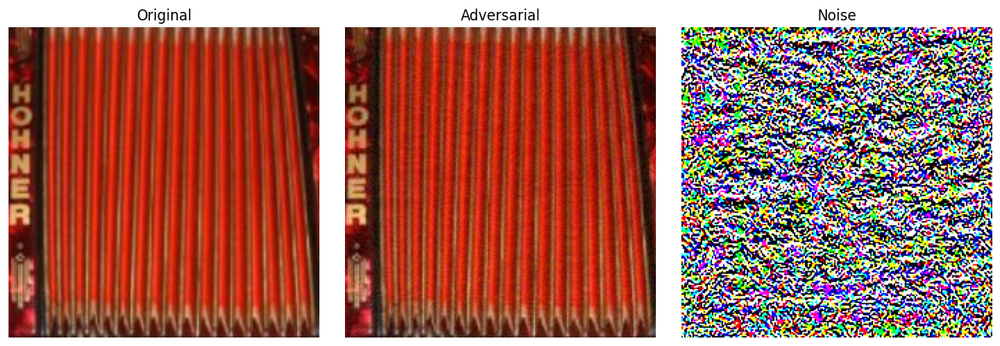

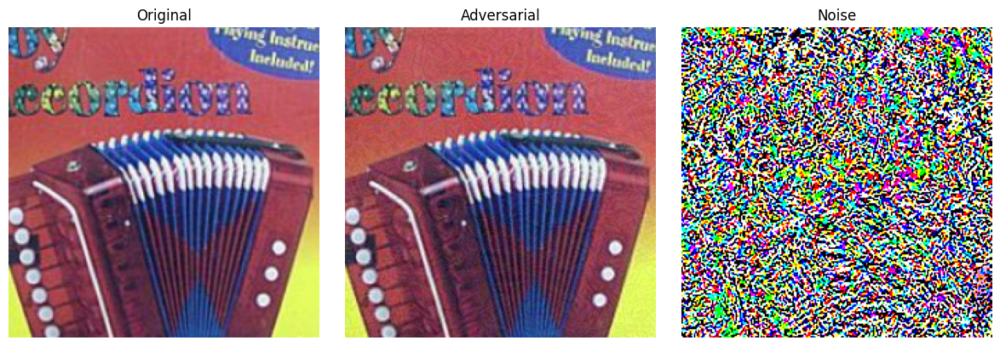

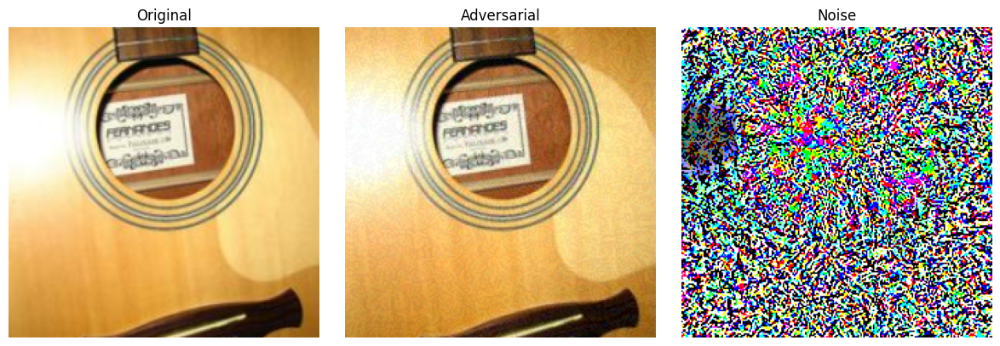

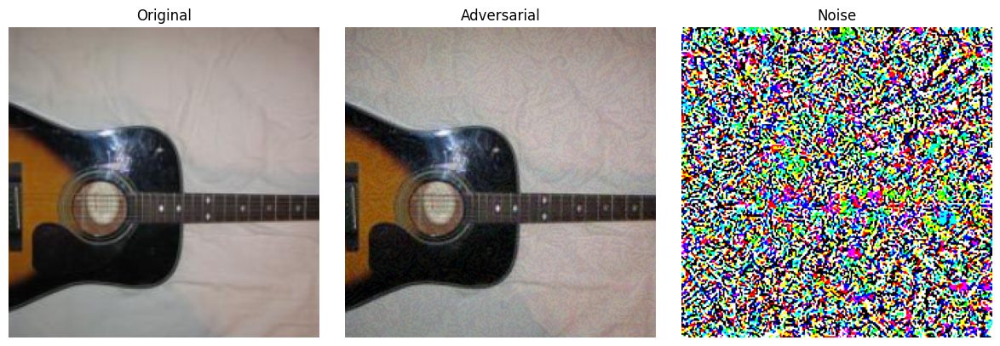

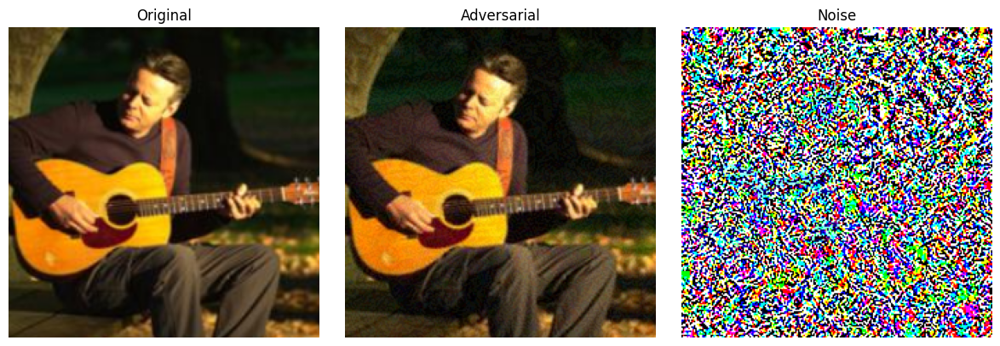

In [11]:
def visualize_attack(img_orig, img_adv, label, model):
    pert = img_adv - img_orig
    pert = (pert - pert.min()) / (pert.max() - pert.min())


    fig, axs = plt.subplots(1, 3, figsize=(12, 4))
    axs[0].imshow(to_pil_image(img_orig.squeeze()))
    axs[0].set_title("Original"); axs[0].axis("off")

    axs[1].imshow(to_pil_image(img_adv.squeeze()))
    axs[1].set_title("Adversarial"); axs[1].axis("off")

    axs[2].imshow(to_pil_image(pert.squeeze()))
    axs[2].set_title("Noise"); axs[2].axis("off")

    plt.tight_layout()
    plt.show()

for img_o, img_a, lbl in mis_examples:
    visualize_attack(img_o, img_a, lbl, model)

# Task 3

In [12]:
# ─── Task 3: PGD 攻击 ─────────────────────────────────────────────

import torch.nn as nn
# from utils import pgd_attack, AdvDataset, RAW_TRANSFORM, NORM_TRANSFORM, compute_topk_accuracy, numeric_labels

# 创建 PGD 对抗集路径
pgd_dir = "/content/drive/MyDrive/NYU CS/Deep Learning/project3/Adversarial_Test_Set_2" #"./Adversarial_Test_Set_2"
os.makedirs(pgd_dir, exist_ok=True)

# 生成 PGD 对抗样本
epsilon = 0.02
alpha = 0.005
iters = 10

raw_ds = datasets.ImageFolder(dataset_pa, transform=RAW_TRANSFORM)
loader = DataLoader(raw_ds, batch_size=1, shuffle=False, num_workers=4)

mis_examples_pgd = []
max_linf_pgd = 0.0

for idx, (img, folder_idx) in enumerate(tqdm(loader)):
    img = img.to(device)
    # 构造标签张量 & 提取 true_idx
    y = torch.tensor([ numeric_labels[folder_idx.item()] ], device=device)
    true_idx = y.item()
    adv = pgd_attack(model, img, y, epsilon, alpha, iters, mean, std)

    linf = (adv - img).abs().max().item()
    max_linf_pgd = max(max_linf_pgd, linf)
    assert linf <= epsilon + 1e-6, f"PGD L∞={linf:.5f} > ε"

    save_path = os.path.join(pgd_dir, f"{idx:04d}.png")
    save_image(adv.cpu(), save_path)

    # 收集前 5 个“原本正确 → 后误判”的示例
    if len(mis_examples_pgd) < 5:
        with torch.no_grad():
            pred_o = model((img - mean)/std).argmax(1).item()
            pred_a = model((adv - mean)/std).argmax(1).item()
        if pred_o == true_idx and pred_a != true_idx:
            mis_examples_pgd.append((img.cpu(), adv.cpu(), true_idx))

print(f"[PGD] Maximum L∞ distance: {max_linf_pgd:.5f}")

# 评估 PGD 对抗集
expanded_labels = [ numeric_labels[i] for i in range(100) for _ in range(5) ]
adv_ds_pgd = AdvDataset(pgd_dir, expanded_labels, NORM_TRANSFORM)
adv_lo_pgd = DataLoader(adv_ds_pgd, batch_size=32, shuffle=False, num_workers=4)

model.eval()
sum1 = sum5 = n = 0
with torch.no_grad():
    for x, y in adv_lo_pgd:
        x, y = x.to(device), torch.tensor(y, device=device)
        logits = model(x) # (x - mean)/std)
        acc = compute_topk_accuracy(logits, y, topk=(1,5))
        bsz = y.size(0)
        sum1 += acc[1] * bsz / 100.0
        sum5 += acc[5] * bsz / 100.0
        n    += bsz
pgd_top1 = 100.0 * sum1 / n
pgd_top5 = 100.0 * sum5 / n
print(f"PGD Top-1: {pgd_top1:.2f}%, PGD Top-5: {pgd_top5:.2f}%")

# drop rate
drop1 = (baseline_top1 - pgd_top1) / baseline_top1 * 100
drop5 = (baseline_top5 - pgd_top5) / baseline_top5 * 100

print(f"PGD Top-1 Accuracy: {pgd_top1:.2f}%  (Drop {drop1:.2f}%)")
print(f"PGD Top-5 Accuracy: {pgd_top5:.2f}%  (Drop {drop5:.2f}%)")



100%|██████████| 500/500 [01:41<00:00,  4.93it/s]

[PGD] Maximum L∞ distance: 0.02000



<ipython-input-12-dfcc37edf66d>:54: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x, y = x.to(device), torch.tensor(y, device=device)


PGD Top-1: 0.00%, PGD Top-5: 0.80%
PGD Top-1 Accuracy: 0.00%  (Drop 100.00%)
PGD Top-5 Accuracy: 0.80%  (Drop 99.15%)


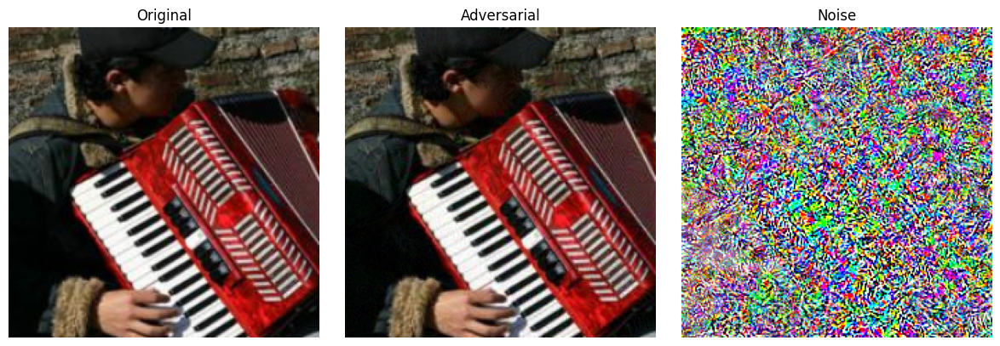

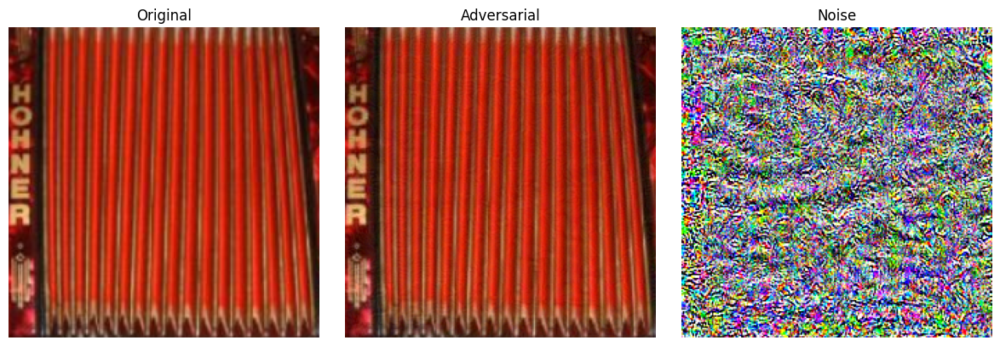

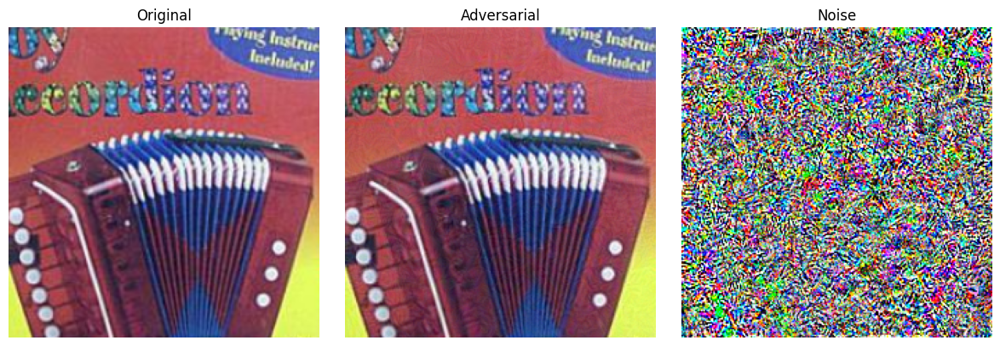

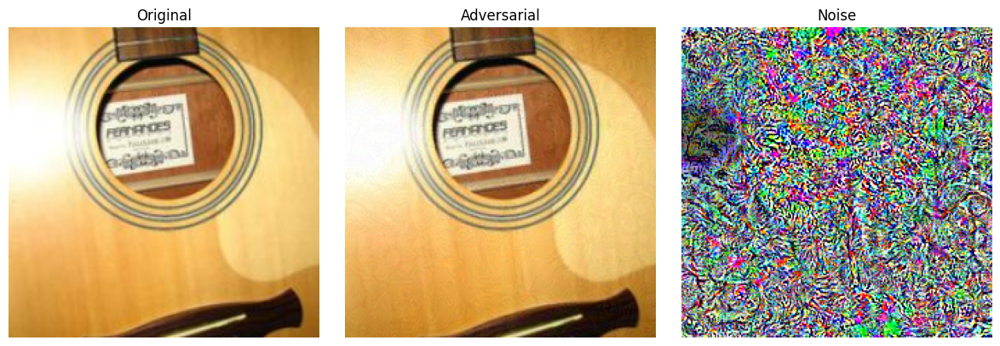

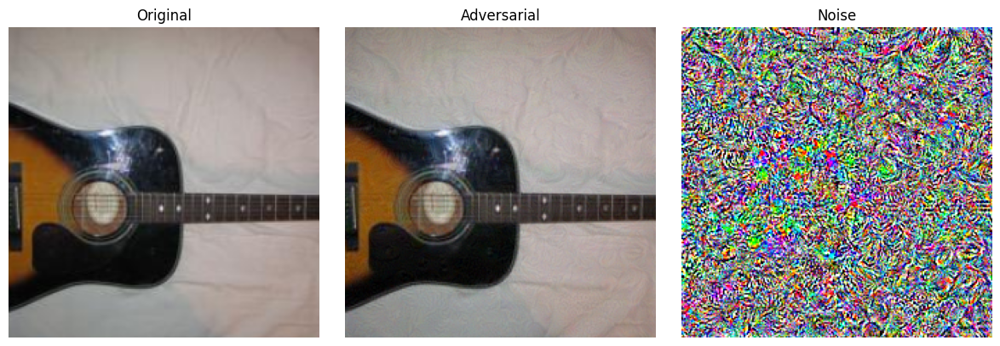

In [13]:
def visualize_attack(img_orig, img_adv, label):

    pert = img_adv - img_orig
    pert = (pert - pert.min()) / (pert.max() - pert.min() + 1e-8)

    fig, axs = plt.subplots(1, 3, figsize=(12, 4))

    axs[0].imshow(to_pil_image(img_orig.squeeze()))
    axs[0].set_title("Original")
    axs[0].axis("off")

    axs[1].imshow(to_pil_image(img_adv.squeeze()))
    axs[1].set_title("Adversarial")
    axs[1].axis("off")

    axs[2].imshow(to_pil_image(pert.squeeze()))
    axs[2].set_title("Noise")
    axs[2].axis("off")

    plt.tight_layout()
    plt.show()
for img_o, img_a, lbl in mis_examples_pgd:
    visualize_attack(img_o, img_a, lbl)


# Task 4

In [14]:
import os, torch
import torch.nn.functional as F
from torchvision import datasets, models
from torchvision.utils import save_image
from torch.utils.data import DataLoader
# from utils import (pgd_patch_attack, AdvDataset,
#                    RAW_TRANSFORM, NORM_TRANSFORM,
#                    compute_topk_accuracy, numeric_labels)
from tqdm import tqdm
from PIL import Image
import matplotlib.pyplot as plt
from torchvision.transforms.functional import to_pil_image
import random

# setting
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
epsilon = 0.4
alpha = 0.025
iters = 30
patch_size = 32
# dataset_pa = "./TestDataSet"
patch_dir = "/content/drive/MyDrive/NYU CS/Deep Learning/project3/Adversarial_Test_Set_3" # "./Adversarial_Test_Set_3"
os.makedirs(patch_dir, exist_ok=True)

# pre-processing
prep = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor()
])
normalized_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std= [0.229, 0.224, 0.225])
])
mean = torch.tensor([0.485, 0.456, 0.406], device=device).view(1,3,1,1)
std  = torch.tensor([0.229, 0.224, 0.225], device=device).view(1,3,1,1)

raw_ds = datasets.ImageFolder(dataset_pa, transform=RAW_TRANSFORM)
loader = DataLoader(raw_ds, batch_size=1, shuffle=False, num_workers=4)

mis_examples_patch = []
max_linf_patch = 0.0

for idx, (img, folder_idx) in enumerate(tqdm(loader)):
    img = img.to(device)
    y   = torch.tensor([ numeric_labels[folder_idx.item()] ], device=device)
    adv = pgd_patch_attack(model, img, y,
                           epsilon, alpha, iters,
                           mean, std, patch_size,
                           random_patch=False)
    linf = (adv - img).abs().max().item()
    max_linf_patch = max(max_linf_patch, linf)
    save_path = os.path.join(patch_dir, f"{idx:04d}.png")
    save_image(adv.cpu(), save_path)
    if len(mis_examples_patch) < 5:
        with torch.no_grad():
            pred_o = model((img - mean) / std).argmax(1).item()
            pred_a = model((adv - mean) / std).argmax(1).item()
        if pred_o == true_idx and pred_a != true_idx:
            mis_examples_patch.append((img.cpu(), adv.cpu(), true_idx))

print(f"[Patch] Max L∞: {max_linf_patch:.5f}")

# evaluation
expanded_labels = [ numeric_labels[i] for i in range(100) for _ in range(5) ]
adv_ds_patch = AdvDataset(patch_dir, expanded_labels, NORM_TRANSFORM)
adv_loader   = DataLoader(adv_ds_patch, batch_size=32, shuffle=False, num_workers=4)

model.eval()
sum1 = sum5 = n = 0
with torch.no_grad():
    for x, y in adv_loader:
        x, y = x.to(device), torch.tensor(y, device=device)
        logits = model(x) #(x - mean)/std)
        acc = compute_topk_accuracy(logits, y, topk=(1,5))
        bsz = y.size(0)
        sum1 += acc[1] * bsz / 100.0
        sum5 += acc[5] * bsz / 100.0
        n    += bsz
patch_top1 = 100.0 * sum1 / n
patch_top5 = 100.0 * sum5 / n
print(f"[Patch] Top-1: {patch_top1:.2f}%, Top-5: {patch_top5:.2f}%")


100%|██████████| 500/500 [04:01<00:00,  2.07it/s]

[Patch] Max L∞: 0.40000



<ipython-input-14-2b8b774f65e6>:77: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x, y = x.to(device), torch.tensor(y, device=device)


[Patch] Top-1: 9.80%, Top-5: 38.20%


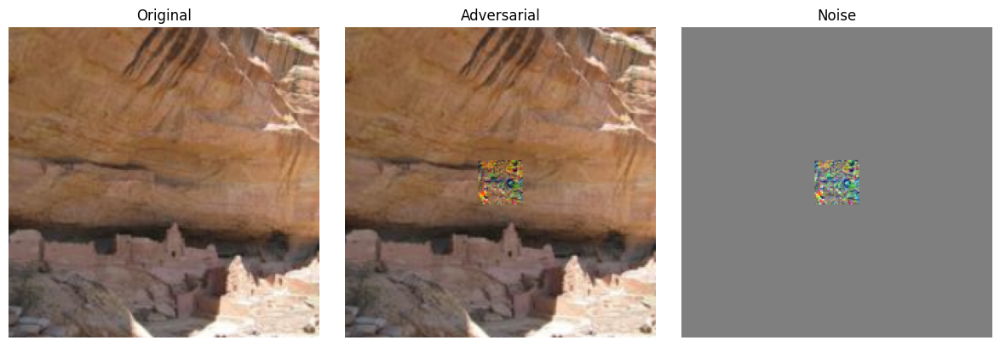

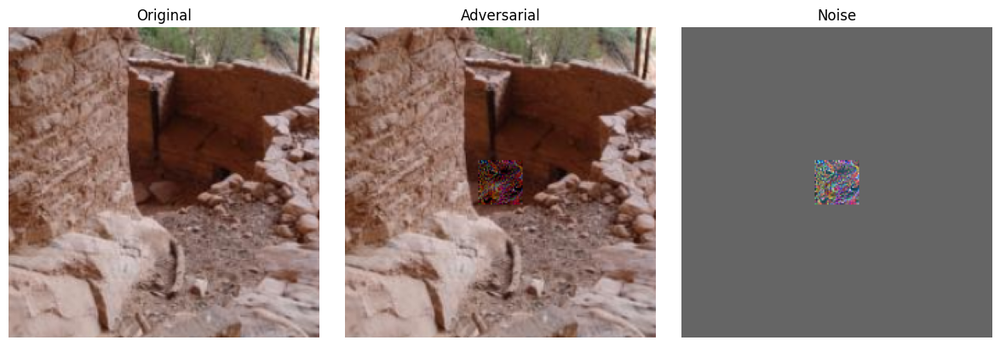

In [15]:
def visualize_attack(img_orig, img_adv, label):

    pert = img_adv - img_orig
    pert = (pert - pert.min()) / (pert.max() - pert.min() + 1e-8)

    fig, axs = plt.subplots(1, 3, figsize=(12, 4))

    axs[0].imshow(to_pil_image(img_orig.squeeze()))
    axs[0].set_title("Original")
    axs[0].axis("off")

    axs[1].imshow(to_pil_image(img_adv.squeeze()))
    axs[1].set_title("Adversarial")
    axs[1].axis("off")

    axs[2].imshow(to_pil_image(pert.squeeze()))
    axs[2].set_title("Noise")
    axs[2].axis("off")

    plt.tight_layout()
    plt.show()
for img_o, img_a, lbl in mis_examples_patch:
    visualize_attack(img_o, img_a, lbl)


# Task 5

In [17]:
#!/usr/bin/env python3
import os
import torch
from torchvision import datasets, models
from torch.utils.data import DataLoader
# from utils import (
#     AdvDataset,
#     RAW_TRANSFORM,
#     NORM_TRANSFORM,
#     compute_topk_accuracy,
#     numeric_labels
# )

def main():
    # Device
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Load pre-trained DenseNet-121
    model = models.densenet121(
        weights=models.DenseNet121_Weights.IMAGENET1K_V1
    ).to(device).eval()

    # L∞ normalization parameters
    mean = torch.tensor([0.485, 0.456, 0.406], device=device).view(1, 3, 1, 1)
    std  = torch.tensor([0.229, 0.224, 0.225], device=device).view(1, 3, 1, 1)

    # Build labels list: 100 classes × 5 examples each = 500
    expanded_labels = [numeric_labels[i] for i in range(100) for _ in range(5)]

    # Paths to all datasets
    datasets_paths = {
        "Original":           dataset_path,
        "AdvTestSet1_FGSM":   "/content/drive/MyDrive/NYU CS/Deep Learning/project3/Adversarial_Test_Set_1", #"/Adversarial_Test_Set_1",
        "AdvTestSet2_PGD":    "/content/drive/MyDrive/NYU CS/Deep Learning/project3/Adversarial_Test_Set_2", #"./Adversarial_Test_Set_2",
        "AdvTestSet3_Patch":  "/content/drive/MyDrive/NYU CS/Deep Learning/project3/Adversarial_Test_Set_3", #"./Adversarial_Test_Set_3",
    }

    results = []

    # Evaluate each dataset
    for name, path in datasets_paths.items():
        model.eval()
        sum1 = sum5 = n = 0

        # Choose appropriate Dataset and Transform
        if name == "Original":
            ds = datasets.ImageFolder(path, transform=RAW_TRANSFORM)
        else:
            ds = AdvDataset(path, expanded_labels, NORM_TRANSFORM)

        loader = DataLoader(ds, batch_size=32, shuffle=False, num_workers=4)

        with torch.no_grad():
            for x, y in loader:
                x = x.to(device)
                # Build target tensor
                if name == "Original":
                    # y here is folder index 0–99, map to global 0–999
                    y = torch.tensor(
                        [numeric_labels[idx] for idx in y.tolist()],
                        device=device
                    )
                else:
                    # y already holds global labels
                    y = torch.tensor(y, device=device)

                # Normalize and forward
                logits = model((x - mean) / std)

                # Compute top-1/top-5
                acc = compute_topk_accuracy(logits, y, topk=(1,5))
                bsz = y.size(0)
                sum1 += acc[1] * bsz / 100.0
                sum5 += acc[5] * bsz / 100.0
                n    += bsz

        # Aggregate results
        top1 = 100.0 * sum1 / n
        top5 = 100.0 * sum5 / n
        results.append((name, n, top1, top5))

    # Print results table
    print("\n--- Task 5 Results: DenseNet-121 Performance ---")
    print("-------------------------------------------------------------")
    print(f"{'Dataset':<25} | {'Samples':<7} | {'Top-1 Acc (%)':<14} | {'Top-5 Acc (%)'}")
    print("-------------------------------------------------------------")
    for name, total, acc1, acc5 in results:
        print(f"{name:<25} | {total:<7} | {acc1:<14.2f} | {acc5:.2f}")
    print("-------------------------------------------------------------")

if __name__ == "__main__":
    main()


<ipython-input-17-007635d1807e>:65: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  y = torch.tensor(y, device=device)



--- Task 5 Results: DenseNet-121 Performance ---
-------------------------------------------------------------
Dataset                   | Samples | Top-1 Acc (%)  | Top-5 Acc (%)
-------------------------------------------------------------
Original                  | 500     | 70.80          | 91.20
AdvTestSet1_FGSM          | 500     | 38.20          | 68.60
AdvTestSet2_PGD           | 500     | 38.00          | 69.00
AdvTestSet3_Patch         | 500     | 54.00          | 80.60
-------------------------------------------------------------
